![tracker](https://us-central1-vertex-ai-mlops-369716.cloudfunctions.net/pixel-tracking?path=statmike%2Fvertex-ai-mlops%2FApplied+GenAI&file=Getting+Started+-+Vertex+AI+GenAI+Python+Client.ipynb)
<!--- header table --->
<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Getting%20Started%20-%20Vertex%20AI%20GenAI%20Python%20Client.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/colab-logo-32px.png" alt="Google Colaboratory logo">
      <br>Run in<br>Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https%3A%2F%2Fraw.githubusercontent.com%2Fstatmike%2Fvertex-ai-mlops%2Fmain%2FApplied%2520GenAI%2FGetting%2520Started%2520-%2520Vertex%2520AI%2520GenAI%2520Python%2520Client.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo">
      <br>Run in<br>Colab Enterprise
    </a>
  </td>      
  <td style="text-align: center">
    <a href="https://github.com/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Getting%20Started%20-%20Vertex%20AI%20GenAI%20Python%20Client.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/github-logo-32px.png" alt="GitHub logo">
      <br>View on<br>GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/Getting%20Started%20-%20Vertex%20AI%20GenAI%20Python%20Client.ipynb">
      <img src="https://lh3.googleusercontent.com/UiNooY4LUgW_oTvpsNhPpQzsstV5W8F7rYgxgGBD85cWJoLmrOzhVs_ksK_vgx40SHs7jCqkTkCk=e14-rj-sc0xffffff-h130-w32" alt="Vertex AI logo">
      <br>Open in<br>Vertex AI Workbench
    </a>
  </td>
</table>

# Getting Started - Vertex AI GenAI Python Client

How to get information into (prompts) and out of (responses) of Vertex AI hosted Generative AI Models!

Vertex AI has access to hosted [generative AI](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/overview) models, called foundation models.  These can be easily interacted with in the console using [Vertex AI Generative AI Studio](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/generative-ai-studio).  This notebook covers interacting with the models with the [`vertexai`](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai) Python package that is include with the Vertex AI SDK [aiplatform](https://cloud.google.com/python/docs/reference/aiplatform/latest).

- Gemini API (Multimodal data, text, code, chat)
    - `vertexai.generative_models`
- PaLM API (Text, chat, embeddings)
    - `vertexai.language_models`
- Codey APIs (Code generation, code chat, code completion)
    - `vertexai.language_models`
- Imagen API (Image generation, image editing, image captioning, visual question answering, and multimodal embedding)
    - `vertexai.vision_models`

The current models in GA and in preview can be reviewed in the [documentation](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/models) as well as within the [Vertex AI Model Garden](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/model-garden) which also include access to serving and tuning OSS models.

Model have names and versions.  The [names](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/models#model_naming_scheme) are designed show both the purpose and size of the model.  For instance, sizes are conveyed with names like `Bison` and `Gecko` while purposes are `text`, `textembedding`, `chat`, `code`, `imagetext`, `imagegeneration` and more.  [Versions](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/model-versioning)  are either `stable` and available for six months after the release of subsequent version, or `latest` which are incremenatally updated and improved but can give different responses to the same prompt.

---
## Colab Setup

To run this notebook in Colab click [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Getting%20Started%20-%20Vertex%20AI%20GenAI%20Python%20Client.ipynb) and run the cells in this section.  Otherwise, skip this section.

This cell will authenticate to GCP (follow prompts in the popup).

In [1]:
PROJECT_ID = 'statmike-mlops-349915' # replace with project ID

In [2]:
try:
    import google.colab
    from google.colab import auth
    auth.authenticate_user()
    !gcloud config set project {PROJECT_ID}
except Exception:
    pass

---
## Installs

The list `packages` contains tuples of package import names and install names.  If the import name is not found then the install name is used to install quitely for the current user.

In [3]:
# tuples of (import name, install name, min_version)
packages = [
    ('google.cloud.aiplatform', 'google-cloud-aiplatform'),
    ('google.cloud.storage', 'google-cloud-storage')
]

import importlib
install = False
for package in packages:
    if not importlib.util.find_spec(package[0]):
        print(f'installing package {package[1]}')
        install = True
        !pip install {package[1]} -U -q --user
    elif len(package) == 3:
        if importlib.metadata.version(package[0]) < package[2]:
            print(f'updating package {package[1]}')
            install = True
            !pip install {package[1]} -U -q --user

### Restart Kernel (If Installs Occured)

After a kernel restart the code submission can start with the next cell after this one.

In [4]:
if install:
    import IPython
    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)

---
## Setup

inputs:

In [5]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [6]:
REGION = 'us-central1'
SERIES = 'applied-genai'
EXPERIMENT = 'getting-started'

# Set the BUCKET name for saving work:
BUCKET = PROJECT_ID

packages:

In [37]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from google.cloud import aiplatform
from google.cloud import storage

import vertexai.vision_models # Imagen Models
import vertexai.preview.vision_models
import vertexai.language_models # PaLM and Codey Models
import vertexai.generative_models # for Gemini Models

import json
import asyncio
import requests
import IPython

In [8]:
aiplatform.__version__

'1.48.0'

clients:

In [158]:
vertexai.init(project = PROJECT_ID, location = REGION)
gcs = storage.Client(project = PROJECT_ID)

bucket = gcs.lookup_bucket(BUCKET)

---
## Vertex AI Package

With the [vertexai](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai) client there are packages for the types of data being interacted with.  There is also a higher package for preview models (not yet in GA).

> **NOTE:** In can be helpful to review the API Documentation at it's source in GitHub for up to the moment release information: [github/googleapis/python-aiplatform](https://github.com/googleapis/python-aiplatform/tree/main)

Gemini Text and Multimodal Models:
- [vertexai.generative_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.generative_models)
    - [vertexai.preview.generative_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.preview.generative_models)

Language Models (PaLM and Codey Models):
- [vertexai.language_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models)
    - [vertexai.preview.language_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.preview.language_models)

Vision Models (Imagen Models):
- [vertexai.vision_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models)
    - [vertexai.preview.vision_models()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.preview.vision_models)


In [157]:
# Gemini Models
gemini_text = vertexai.generative_models.GenerativeModel("gemini-1.0-pro")
gemini_multimodal = vertexai.generative_models.GenerativeModel("gemini-1.0-pro-vision")
gemini15_multimodal = vertexai.generative_models.GenerativeModel("gemini-1.5-pro-preview-0409")

# PaLM and Codey Models
text_model = vertexai.language_models.TextGenerationModel.from_pretrained('text-bison')
chat_model = vertexai.language_models.ChatModel.from_pretrained('chat-bison')
textembed_model = vertexai.language_models.TextEmbeddingModel.from_pretrained('textembedding-gecko')
codegen_model = vertexai.language_models.CodeGenerationModel.from_pretrained('code-bison')
codecomp_model = vertexai.language_models.CodeGenerationModel.from_pretrained('code-gecko')
codechat_model = vertexai.language_models.CodeChatModel.from_pretrained('codechat-bison')

# Imagen Models
imagecap_model = vertexai.vision_models.ImageCaptioningModel.from_pretrained("imagetext")
imageqna_model = vertexai.vision_models.ImageQnAModel.from_pretrained("imagetext")
imagetext_model = vertexai.vision_models.ImageTextModel.from_pretrained("imagetext")
multimodalembed_model = vertexai.vision_models.MultiModalEmbeddingModel.from_pretrained('multimodalembedding')
imagen1_model = vertexai.preview.vision_models.ImageGenerationModel.from_pretrained('imagegeneration@002')
imagen2_model = vertexai.preview.vision_models.ImageGenerationModel.from_pretrained('imagegeneration@005')

---
## Gemini Models

[Reference: Gemini API](https://cloud.google.com/vertex-ai/docs/generative-ai/model-reference/gemini)

### Text Prompt

In [47]:
prompt = "What are the starting points for AI?"

In [48]:
response = gemini_text.generate_content(prompt)
response

candidates {
  content {
    role: "model"
    parts {
      text: "## Starting Points for AI: A Beginner\'s Guide\n\nHere\'s a breakdown of the starting points for AI, depending on your goals and interests:\n\n**If you\'re curious about AI and want to learn the basics:**\n\n* **Online Resources:**\n    * **Websites:**\n        * **Kaggle Learn:** https://www.kaggle.com/learn/overview\n        * **Coursera AI for Everyone Specialization:** https://www.coursera.org/specializations/ai-for-everyone\n        * **Fast.ai Practical Deep Learning for Coders:** https://course.fast.ai/\n    * **Blog Posts:**\n        * **What is Artificial Intelligence?:** https://builtin.com/machine-learning/introduction-to-artificial-intelligence\n        * **100 Days of AI:** https://www.100daysofai.org/\n    * **YouTube Channels:**\n        * **Yannic Kilcher:** https://www.youtube.com/c/YannicKilcher\n        * **Lex Fridman Podcast:** https://www.youtube.com/c/LexFridmanPodcast\n* **Books:**\n    * **Arti

In [49]:
print(response.text)

## Starting Points for AI: A Beginner's Guide

Here's a breakdown of the starting points for AI, depending on your goals and interests:

**If you're curious about AI and want to learn the basics:**

* **Online Resources:**
    * **Websites:**
        * **Kaggle Learn:** https://www.kaggle.com/learn/overview
        * **Coursera AI for Everyone Specialization:** https://www.coursera.org/specializations/ai-for-everyone
        * **Fast.ai Practical Deep Learning for Coders:** https://course.fast.ai/
    * **Blog Posts:**
        * **What is Artificial Intelligence?:** https://builtin.com/machine-learning/introduction-to-artificial-intelligence
        * **100 Days of AI:** https://www.100daysofai.org/
    * **YouTube Channels:**
        * **Yannic Kilcher:** https://www.youtube.com/c/YannicKilcher
        * **Lex Fridman Podcast:** https://www.youtube.com/c/LexFridmanPodcast
* **Books:**
    * **Artificial Intelligence: A Modern Approach (4th Edition):** https://www.amazon.com/Artificial

In [50]:
#IPython.display.Markdown(response.text)

#### Streaming Response

In [56]:
for response in gemini_text.generate_content(prompt, stream = True):
    print(response.text)

## Starting Points for
 Learning AI

**1. Choose Your Approach:**

* **Self-Paced:** Online courses and tutorials
 offer flexibility and often come at a low cost.
* **Structured Learning:** Boot camps and
 degree programs provide guidance and support but can be pricier.
* **Community Engagement:** Participating in forums, attending meetups, and collaborating on projects allows for interactive learning.

**2. Foundational Skills:**

* **Math
:** Calculus, linear algebra, statistics, probability theory.
* **Programming:** Python, R, Java, C++.
* **Data Structures & Algorithms:** Understanding how data is organized and manipulated.

**3. Core AI Concepts:**

*
 **Machine Learning:** Supervised, unsupervised, and reinforcement learning algorithms.
* **Deep Learning:** Artificial neural networks, convolutional neural networks (CNNs), recurrent neural networks (RNNs).
* **Natural Language Processing (NLP):** Text analysis, machine translation, sentiment analysis.
* **Computer Vision:** Objec

#### Async Response

The client has built in method for awaitable responses that make it easy to make asynchronous request.

> For detailed coverage and examples of asynchronous call to these API's, scaling, error handling, and managing fail over regions check out this notebook in the same folder: [Python Asynchronous API Calls](./Python%20Asynchronous%20API%20Calls.ipynb)

In [57]:
response = await gemini_text.generate_content_async(prompt)
print(response.text)
#IPython.display.Markdown(response.text)

## Starting Points for AI: Where to Begin Your Artificial Intelligence Journey

Embarking on your AI adventure can be exciting, but knowing where to start can be daunting. Here are some starting points to guide you:

**1. Understanding the Fundamentals:**

* **What is AI?** Start by building a basic understanding of artificial intelligence. Explore its different types, including machine learning, deep learning, and natural language processing. 
* **Key Concepts:** Grasp essential concepts like algorithms, data, models, and training.
* **Resources:** Numerous online resources can help you grasp the basics. Some recommended resources are:
    * **Websites:**
        * https://ai.google/education/
        * https://www.ibm.com/cloud/learn/artificial-intelligence
        * https://www.coursera.org/learn/introduction-to-ai
    * **Books:**
        * "Artificial Intelligence: A Modern Approach" by Stuart Russell and Peter Norvig
        * "Machine Learning: A Probabilistic Perspective" by Ke

#### Multiple Responses

Use async requests to get multiple responses.

In [60]:
responses = await asyncio.gather(*[
    gemini_text.generate_content_async(prompt) for i in range(2)
])

In [61]:
for r in responses:
    print(r.text[0:1000])
    #IPython.display.display(IPython.display.Markdown(r.text[0:1000]))
    print('\n\n\n-----------------------------------------------------------------------------\n\n\n')
    #IPython.display.display(IPython.display.Markdown('\n-----------------------------------------------------------------------------'))

The field of Artificial Intelligence (AI) has its roots in various scientific disciplines and historical events, but some key starting points are generally considered to be:

**1. Dartmouth Workshop (1956):** This workshop, held in Hanover, New Hampshire, is often considered the official birth of AI as a field. A group of leading researchers, including John McCarthy, Marvin Minsky, Claude Shannon, and Nathaniel Rochester, came together to discuss the possibilities of creating intelligent machines. The workshop is credited with defining the field's goals and setting its research agenda for many years.

**2. Early AI Programs (1950s-1960s):** Following the Dartmouth workshop, researchers developed some of the first AI programs. These included:
  * The Logic Theorist (1955), which could prove mathematical theorems
  * The General Problem Solver (1957), a program designed to solve problems in a variety of domains
  * ELIZA (1966), a chatbot that could hold simple conversations with humans


#### Parameters For Configuration

[Reference: Gemini API](https://cloud.google.com/vertex-ai/docs/generative-ai/model-reference/gemini)

In [63]:
response = gemini_text.generate_content(
    prompt,
    generation_config = vertexai.generative_models.GenerationConfig(
        temperature = 0.5,
        top_p = .8,
        top_k = 25, 
        max_output_tokens = 500
    )
)
response

candidates {
  content {
    role: "model"
    parts {
      text: "## Starting Points for AI:\n\n**1. Understanding the Basics:**\n\n* **What is AI?** It\'s the field of computer science that aims to create intelligent machines that can perform tasks typically requiring human intelligence.\n* **Types of AI:** Machine Learning, Deep Learning, Natural Language Processing, Computer Vision, Robotics, etc.\n* **Applications of AI:** Healthcare, finance, transportation, manufacturing, entertainment, and more.\n\n**2. Learning Resources:**\n\n* **Online Courses:**\n    * **Coursera:** Specializations in AI, Machine Learning, Deep Learning, etc.\n    * **edX:** Courses on AI Fundamentals, Machine Learning, Deep Learning, etc.\n    * **Udacity:** Nanodegrees in AI, Machine Learning, Deep Learning, etc.\n* **Books:**\n    * \"Artificial Intelligence: A Modern Approach\" by Stuart Russell and Peter Norvig\n    * \"Deep Learning\" by Ian Goodfellow, Yoshua Bengio, and Aaron Courville\n    * \"Mac

In [64]:
#IPython.display.Markdown(response.text)

#### Grounding With Vertex AI Search & Conversation

**in preview, need to load preview model client**

Automatically ground prompts in the API call by providing a link to a retrieval source.  In this case Vertex AI Search & Conversation data stores can be directly referenced for context retrieval.

This section uses a data store created in this repository: [Vertex AI Search](./Vertex%20AI%20Search/readme.md)
- A data store and search application are created using the official rules manual of baseball

Reference: [Grounding Model Responses](https://cloud.google.com/vertex-ai/generative-ai/docs/multimodal/ground-gemini)

In [65]:
from vertexai.preview.generative_models import GenerationConfig, grounding, Tool

In [66]:
prompt_baseball = "Is it a homerun when the ball is deflected by a fielder over the outfield fence? Explain."

**Ungrounded Response**:

In [67]:
response = gemini_text.generate_content(
    prompt_baseball)
print(response.text)

Yes, it is a home run when the ball is deflected by a fielder over the outfield fence. This is because, according to Rule 5.05(a)(1) of the Official Baseball Rules, a home run is awarded when "a fair ball goes over either or both of the outfield fences in flight." This means that even if the ball is touched by a fielder before it goes over the fence, it is still considered a home run.

However, there are a few exceptions to this rule. If the fielder intentionally deflects the ball over the fence (e.g., by throwing it over the fence), then it is not a home run. Additionally, if the fielder is standing on or over the fence when they catch the ball, then it is a home run.


This answer comes directly from the LLM, which means it must have had access to baseball information during pre-training.   


**Grounded Response**

Next, the same call to the same llm is done while including a grounding source that includes just the official rules of baseball.  The API will automatically search, retrieve and include context in the prompt for a ground response.

In [72]:
# VERTEX SEARCH PARAMETERS
VS_LOCATION = 'global'
VS_DATASTORE_ID = 'sports_1699306284060'

response = gemini_text.generate_content(
    prompt_baseball,
    generation_config = GenerationConfig(
        temperature = 0.0,
        top_p = .8,
        top_k = 25,
        candidate_count = 1, 
        max_output_tokens = 500
    ),
    tools = [
        Tool.from_retrieval(
            grounding.Retrieval(
                grounding.VertexAISearch(
                    datastore = f"projects/{PROJECT_ID}/locations/{VS_LOCATION}/collections/default_collection/dataStores/{VS_DATASTORE_ID}"
                )
            )
        )
    ]
)
response

candidates {
  content {
    role: "model"
    parts {
      text: "According to the 2022 MLB rule 5.06(c)(6) Comment, if a batted ball is deflected by a fielder in fair territory and hits a runner or an umpire while still in flight and then caught by an infielder, it shall not be a catch, but the ball shall remain in play. Therefore, if the ball is deflected by a fielder over the outfield fence, it is not a home run."
    }
  }
  finish_reason: STOP
  safety_ratings {
    category: HARM_CATEGORY_HATE_SPEECH
    probability: NEGLIGIBLE
    probability_score: 0.08035746961832047
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.03690806403756142
  }
  safety_ratings {
    category: HARM_CATEGORY_DANGEROUS_CONTENT
    probability: NEGLIGIBLE
    probability_score: 0.23686911165714264
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.06406543403863907
  }
  safety_ratings {
    category: HARM_CATEGORY_HARASSMENT
    probability: NEGLIGIBLE
    probability_score: 0.12

In [73]:
print(response.text)

According to the 2022 MLB rule 5.06(c)(6) Comment, if a batted ball is deflected by a fielder in fair territory and hits a runner or an umpire while still in flight and then caught by an infielder, it shall not be a catch, but the ball shall remain in play. Therefore, if the ball is deflected by a fielder over the outfield fence, it is not a home run.


#### Grounding With Google Search

**in preview, need to load preview model client**

Automatically ground prompts in the API call by providing a link to a retrieval source.  In this case web searches can be directly referenced for context retrieval.

[Reference: Grounding Model Responses](https://cloud.google.com/vertex-ai/generative-ai/docs/multimodal/ground-gemini)
- **NOTE:** The header for this page includes a link to form to opt-in to using this feature

In [74]:
from vertexai.preview.generative_models import GenerationConfig, grounding, Tool

In [75]:
prompt_baseball = "Is it a homerun when the ball is deflected by a fielder over the outfield fence? Explain."

**Ungrounded Response**:

In [76]:
response = gemini_text.generate_content(
    prompt_baseball)
print(response.text)

## Is it a homerun when the ball is deflected by a fielder over the outfield fence?

**No, it is not a home run if the ball is deflected by a fielder over the outfield fence.** 

According to the official baseball rules, a home run is awarded when a batted ball:

* **Clears the outfield fence in fair territory without touching the ground.**
* **Is caught by a fielder in fair territory beyond the outfield fence, and then goes over the fence.**
* **Hits the top of the fence and then goes over.**
* **Hits the ground first and then goes over the fence.**

If the ball is deflected by a fielder and goes over the fence, it is considered a **ground-rule double**. This means that the batter is awarded two bases, as if they had hit a double. The runners on base are also awarded two bases.

Here are some additional details about the rule:

* If the ball is deflected by a fielder and goes over the fence in foul territory, it is a foul ball.
* If the ball is deflected by a fielder and goes over the

This answer comes directly from the LLM, which means it must have had access to baseball information during pre-training.   

**Grounded Response**

Next, the same call to the same llm is done while including a grounding source that includes just the official rules of baseball.  The API will automatically search, retrieve and include context in the prompt for a ground response.

In [77]:
response = gemini_text.generate_content(
    prompt_baseball,
    generation_config = GenerationConfig(
        temperature = 0.0,
        top_p = .8,
        top_k = 25, 
        max_output_tokens = 500
    ),
    tools = [Tool.from_google_search_retrieval(grounding.GoogleSearchRetrieval())]
)
response

candidates {
  content {
    role: "model"
    parts {
      text: "Yes, it is a home run if a fair batted ball deflects off the outfielder or the outfielder\'s glove and goes over the wall in fair territory. This is because the ball remains \"in-flight\" until it goes over the wall. However, if the ball deflects out of play into foul territory, it is a two-base award."
    }
  }
  finish_reason: STOP
  safety_ratings {
    category: HARM_CATEGORY_HATE_SPEECH
    probability: NEGLIGIBLE
    probability_score: 0.048136770725250244
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.03173859417438507
  }
  safety_ratings {
    category: HARM_CATEGORY_DANGEROUS_CONTENT
    probability: NEGLIGIBLE
    probability_score: 0.23440665006637573
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.08093670755624771
  }
  safety_ratings {
    category: HARM_CATEGORY_HARASSMENT
    probability: NEGLIGIBLE
    probability_score: 0.10913478583097458
    severity: HARM_SEVERITY_NEGLI

#### Response Mode: Default

With Gemini 1.5, you can request alternate response types like `text/plain` and `apppliation/json`.  The default uses markdown like structure as shown in the follow exampel repeasted form above:

In [97]:
response = gemini15_multimodal.generate_content(
    prompt_baseball,
    generation_config = GenerationConfig(
        temperature = 0.0,
        top_p = .8,
        top_k = 25, 
        max_output_tokens = 500
    )
)
print(response.text)

## Deflected Homerun: Fair or Foul?

Whether a deflected ball over the outfield fence is a home run depends on **who deflected it and where**:

* **Deflected by a fielder:** If a fielder deflects the ball over the fence, it's **not a home run**. Instead, it's a **two-base award** for the batter and any runners on base. This is covered under Rule 5.05(a)(8) in the official baseball rules. 
* **Deflected by a non-fielder (e.g., umpire, bat boy):** If the ball hits a non-fielder and goes over the fence in fair territory, it **is a home run**. 

**The key is whether the deflection is considered intentional.** Fielders are expected to try and catch the ball, so even if they accidentally deflect it over the fence, it's not considered intentional. However, non-fielders are not part of the play, so any deflection by them is considered unintentional and results in a home run. 



In [140]:
MODEL_ID = 'gemini-1.5-pro-preview-0409'
request = dict(
    contents = dict(
        role = 'user',
        parts = dict(
            text = prompt_baseball
        )
    ),
    generationConfig = dict(
        temperature = 0.0,
        topP = .8,
        topK = 25,
        maxOutputTokens = 500
    )
)
token = !gcloud auth application-default print-access-token
headers = {
    "content-type": "application/json",
    "Authorization": f'Bearer {token[0]}'
}

response = requests.post(
    f'https://{REGION}-aiplatform.googleapis.com/v1/projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}:generateContent',
    #data = json.dumps(dict(instances = [request])),
    data = json.dumps(request),
    headers = headers
)

response_text = json.loads(response.text)['candidates'][0]['content']['parts'][0]['text']
print(response_text)

## Deflected Homerun: Fair or Foul?

Whether a deflected ball over the outfield fence is a home run depends on **who deflected it and where it was deflected**. Here's the breakdown:

* **Deflected by a fielder:** If a **fielder** deflects the ball over the fence, it's considered a **home run**. This applies even if the ball was going foul before the deflection. 
* **Deflected by a non-fielder (runner, umpire, etc.):** If anyone **other than a fielder** deflects the ball over the fence, it's ruled a **dead ball**. The batter is awarded a **ground-rule double**, and any runners on base advance two bases.

**Therefore, a ball deflected by a fielder over the outfield fence is indeed a home run!** 



#### Response Mode: `text/plain`

With Gemini 1.5, you can request alternate response types like `text/plain` and `apppliation/json`.

In [159]:
MODEL_ID = 'gemini-1.5-pro-preview-0409'
request = dict(
    contents = dict(
        role = 'user',
        parts = dict(
            text = prompt_baseball
        )
    ),
    generationConfig = dict(
        temperature = 0.0,
        topP = .8,
        topK = 25,
        maxOutputTokens = 500,
        responseMimeType = 'text/plain'
    )
)
token = !gcloud auth application-default print-access-token
headers = {
    "content-type": "application/json",
    "Authorization": f'Bearer {token[0]}'
}

response = requests.post(
    f'https://{REGION}-aiplatform.googleapis.com/v1/projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}:generateContent',
    #data = json.dumps(dict(instances = [request])),
    data = json.dumps(request),
    headers = headers
)

response_text = json.loads(response.text)['candidates'][0]['content']['parts'][0]['text']
print(response_text)

## Deflected Homerun: Fair or Foul?

Whether a deflected ball over the outfield fence is a home run depends on **who deflected it and where it was deflected**. Here's the breakdown:

* **Deflected by a fielder:** If a **fielder deflects the ball** over the outfield fence, in fair territory, it's a **home run**. This applies even if the fielder touches the ball while it's still in the field of play. 
* **Deflected by a runner or umpire:** If the ball is deflected by a **runner or an umpire** over the fence, in fair territory, it's a **dead ball**. The batter is awarded a **ground-rule double**. 
* **Deflected out of play:** If the ball is deflected out of play (over the fence in foul territory), it's considered a **dead ball** regardless of who deflected it. The batter is awarded a **two-base award** from the time of the pitch. 

**Remember, the key factor is who deflects the ball and where it ends up.** 



#### Response Mode: `application/json`

With Gemini 1.5, you can request alternate response types like `text/plain` and `apppliation/json`.

In [162]:
MODEL_ID = 'gemini-1.5-pro-preview-0409'
request = dict(
    contents = dict(
        role = 'user',
        parts = dict(
            text = 'list the dimensions of a baseball field in JSON format.' #prompt_baseball
        )
    ),
    generationConfig = dict(
        temperature = 0.0,
        topP = .8,
        topK = 25,
        maxOutputTokens = 500,
        responseMimeType = 'application/json'
    )
)
token = !gcloud auth application-default print-access-token
headers = {
    "content-type": "application/json",
    "Authorization": f'Bearer {token[0]}'
}

response = requests.post(
    f'https://{REGION}-aiplatform.googleapis.com/v1/projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}:generateContent',
    #data = json.dumps(dict(instances = [request])),
    data = json.dumps(request),
    headers = headers
)

response_text = json.loads(response.text)['candidates'][0]['content']['parts'][0]['text']
print(response_text)

KeyError: 'candidates'

In [163]:
response.text

'{\n  "error": {\n    "code": 500,\n    "message": "Internal error encountered.",\n    "status": "INTERNAL"\n  }\n}\n'

### Chat Prompt

In [169]:
chat = gemini_text.start_chat()

In [170]:
response = chat.send_message(prompt)
print(response.text)
#IPython.display.Markdown(response.text)

## The Starting Points of Artificial Intelligence (AI)

AI has its roots in various disciplines, making pinpointing a single starting point difficult. However, some key moments and areas stand out:

**1. Philosophy and Mathematics (17th-19th centuries):**

* **Gottfried Wilhelm Leibniz's Universal Characteristic (1679):** This work laid the foundation for logical reasoning and symbol manipulation, essential for AI development.
* **George Boole's Boolean Algebra (1854):** This system of binary logic paved the way for digital computers and computational logic.
* **Alan Turing's "Computing Machinery and Intelligence" paper (1950):** This paper introduced the Turing Test, a benchmark for measuring a machine's intelligence.

**2. Computer Science and Engineering (1940s-1960s):**

* **Development of the first electronic computers:** These machines allowed researchers to explore symbolic computation and artificial intelligence.
* **Early AI Programs:**
    * **Alan Turing's Colossus (1943):**

In [171]:
response = chat.send_message('Summarize this in less than 50 words, like the intro to a blog.')
print(response.text)
#IPython.display.Markdown(response.text)

## AI's Birth: A Philosophical Spark Ignited by Computation

Mathematics, philosophy, and early computers laid the foundation for AI, culminating in the rise of machine learning and deep learning, fueled by data and computational power.


In [172]:
print(chat.history)

[role: "user"
parts {
  text: "What are the starting points for AI?"
}
, role: "model"
parts {
  text: "## The Starting Points of Artificial Intelligence (AI)\n\nAI has its roots in various disciplines, making pinpointing a single starting point difficult. However, some key moments and areas stand out:\n\n**1. Philosophy and Mathematics (17th-19th centuries):**\n\n* **Gottfried Wilhelm Leibniz\'s Universal Characteristic (1679):** This work laid the foundation for logical reasoning and symbol manipulation, essential for AI development.\n* **George Boole\'s Boolean Algebra (1854):** This system of binary logic paved the way for digital computers and computational logic.\n* **Alan Turing\'s \"Computing Machinery and Intelligence\" paper (1950):** This paper introduced the Turing Test, a benchmark for measuring a machine\'s intelligence.\n\n**2. Computer Science and Engineering (1940s-1960s):**\n\n* **Development of the first electronic computers:** These machines allowed researchers to e

### Multimodal Prompt

Multimodal means the prompt can be made up of text, image, even video.

First, load an image.  This notebook comes from the GitHub repository [statmike/vertex-ai-mlops](https://github.com/statmike/vertex-ai-mlops/tree/main) which has graphical explanation of many ML and MLOps concepts.

For example:

<p align="center" width="100%" style="align:center;width:100%">
    <figure style="align:center;width:100%">
        <img src="https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png" style="width:75%">
        <figcaption>https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png</figcaption>
    </figure>
</p>

In [81]:
url = 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png'
image_bytes = requests.get(url).content

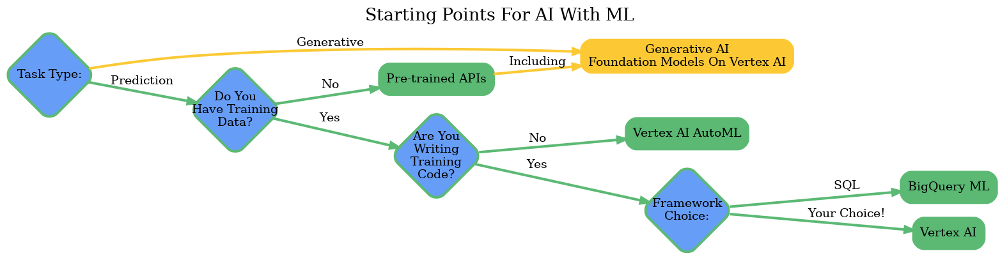

In [82]:
# Image.load_from_bytes, Image.load_from_file
# Part.from_uri, Part.from_text, Part.from_image, Part.from_data
prompt_image = vertexai.generative_models.Image.from_bytes(data = image_bytes)
prompt_image

In [83]:
response = gemini_multimodal.generate_content([prompt_image, prompt])
IPython.display.Markdown(response.text)

 The starting points for AI are:

1. Generative AI
2. Pre-trained APIs
3. Vertex AI AutoML

In [84]:
response = gemini_multimodal.generate_content(
    [prompt_image, 'Describe, in detail, the process depicted in the flowchart.  Call out each decision point and what the possible decision are.']
)
IPython.display.Markdown(response.text)

 The flowchart provides a starting point for using AI with ML. 

The first step is to determine if you have training data. If you do, you can move on to the next step. If you do not, you can use the pre-trained APIs.

The next step is to determine if you are writing training code. If you are, you can move on to the next step. If you are not, you can use Vertex AI AutoML.

The next step is to choose a framework. The options are SQL, BigQuery ML, or your choice. Once you have chosen a framework, you can move on to the next step.

The final step is to use Vertex AI.

**NOTICE:** The response is grounded with the provide image this time!

### System Instructions

Apply system instructions to models (Gemini), that are used for each request to the model for generation.  These are indicated with the `system_instruction` parameter when setting the model with `vertexai.generative_models.GenerativeModel()`.  This can be helpful for chat session (see next section below), where you want to set a context for interaction at the beginning.

**Reference:** [Use system instructions](https://cloud.google.com/vertex-ai/generative-ai/docs/multimodal/send-chat-prompts-gemini#system-instructions)

In [198]:
gemini_text_SI = vertexai.generative_models.GenerativeModel("gemini-1.0-pro", system_instruction = 'You are AI expert who can answer broad and deep question with short, easy to understand narrative.  You prefer to answer in about a paragraph, no more than 4 sentences.')

In [199]:
print(prompt)

What are the starting points for AI?


Response without system instruction:

In [200]:
response = gemini_text.generate_content(prompt)
print(response.text)

The concept of artificial intelligence (AI) has been around for centuries, but its current form can be traced back to a few key starting points:

## 1950s: The Birth of AI

The official birth of AI is often attributed to the Dartmouth Summer Research Project of 1956. This event brought together some of the brightest minds in the field, including John McCarthy, Marvin Minsky, Claude Shannon, and Nathaniel Rochester. Their goal was to explore the possibility of creating "thinking machines," and they laid the foundation for many of the core ideas that we associate with AI today.

## 1960s: Early Progress and Hype

The 1960s saw significant advancements in AI, including the development of the first neural networks, natural language processing systems, and expert systems. However, this early progress was also accompanied by a great deal of hype, and some researchers made overly ambitious claims about what AI could achieve. This led to a period of disillusionment in the field that lasted thr

Response with system instruction:

In [201]:
response = gemini_text_SI.generate_content(prompt)
print(response.text)

While there's no one single starting point for AI, it's a field with roots going back further than many realize. Some key moments in its development include:

* **The 1950s:** Considered the 'birth' of AI, this period saw the emergence of concepts like the Turing Test and early AI programs like the Logic Theorist and the General Problem Solver.
* **The 1960s & 70s:** This time witnessed significant progress in AI research, including the development of early machine learning algorithms like decision trees and the first AI program to win a chess match against a human champion.
* **The 1980s & 90s:** These decades saw a focus on practical applications of AI, leading to advances in expert systems, robotics, and even the first self-driving car prototypes.
* **Today:** AI is experiencing a period of rapid innovation and growth, driven by vast amounts of data, increased computing power, and new deep learning techniques.

While some consider the pursuit of "true AI," or artificial general inte

### Chat For Coding

Recall the description of the flow chart in the section above.  Let generate Python code to plot this.

In [108]:
chat = gemini_text.start_chat()

In [109]:
response = chat.send_message(
    [response.text, 'Write a Python program that will generate a flowchart of this.']
)
IPython.display.Markdown(response.text)

```python
import graphviz

def generate_flowchart():
  """Generates a flowchart of the ML project decision tree."""

  # Create a graphviz Digraph object
  graph = graphviz.Digraph(format='png')

  # Add the starting node
  graph.node('start', 'Start')

  # Add the first decision node
  graph.node('have_training_data', 'Do you have training data?')

  # Add the edges from the first decision node
  graph.edge('start', 'have_training_data')
  graph.edge('have_training_data', 'yes')
  graph.edge('have_training_data', 'no')

  # Add the second decision node
  graph.node('use_pre_trained_apis', 'Do you want to use pre-trained APIs?')

  # Add the edges from the second decision node
  graph.edge('yes', 'use_pre_trained_apis')
  graph.edge('use_pre_trained_apis', 'yes')
  graph.edge('use_pre_trained_apis', 'no')

  # Add the third decision node
  graph.node('write_own_training_code', 'Do you want to write your own training code?')

  # Add the edges from the third decision node
  graph.edge('no', 'write_own_training_code')
  graph.edge('write_own_training_code', 'yes')

  # Add the fourth decision node
  graph.node('generate_synthetic_data', 'Do you want to generate synthetic data?')

  # Add the edges from the fourth decision node
  graph.edge('write_own_training_code', 'generate_synthetic_data')
  graph.edge('generate_synthetic_data', 'yes')
  graph.edge('generate_synthetic_data', 'no')

  # Add the fifth decision node
  graph.node('train_model', 'Train model')

  # Add the edges from the fifth decision node
  graph.edge('yes', 'train_model')
  graph.edge('no', 'train_model')

  # Add the sixth decision node
  graph.node('make_predictions', 'Make predictions')

  # Add the edges from the sixth decision node
  graph.edge('train_model', 'make_predictions')

  # Render the graph
  graph.render('flowchart.png')

if __name__ == '__main__':
  generate_flowchart()
```

In [110]:
code = '\n'.join(response.text.splitlines()[1:-1])

In [111]:
exec(code)

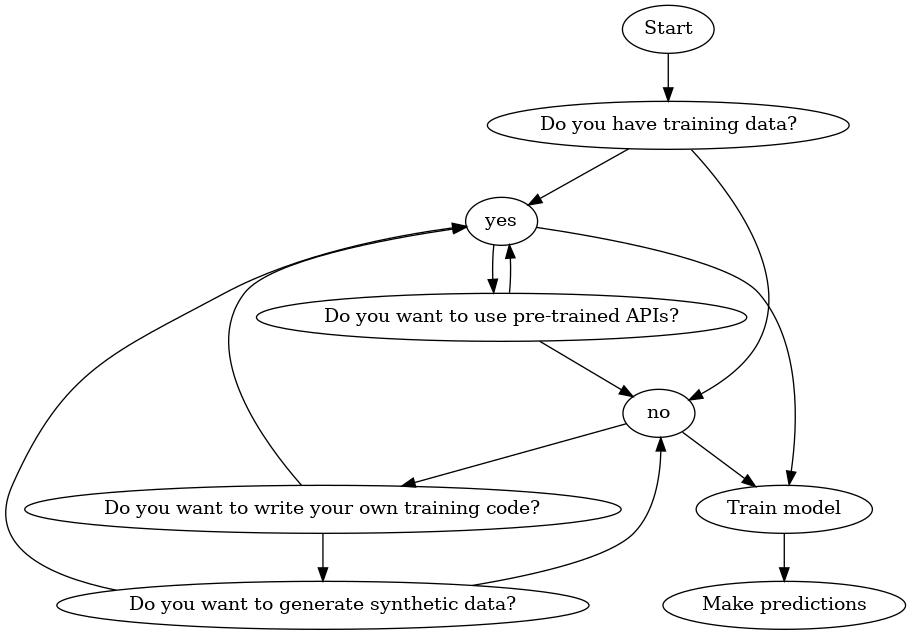

In [112]:
IPython.display.Image('flowchart.png.png')

In [113]:
response = chat.send_message(
    ['Modify this code to include the labels on the connectors.'])
IPython.display.Markdown(response.text)

```python
import graphviz

def generate_flowchart():
  """Generates a flowchart of the ML project decision tree with labels on the connectors."""

  # Create a graphviz Digraph object
  graph = graphviz.Digraph(format='png')

  # Add the starting node
  graph.node('start', 'Start')

  # Add the first decision node
  graph.node('have_training_data', 'Do you have training data?')

  # Add the edges from the first decision node
  graph.edge('start', 'have_training_data', label='Yes/No')
  graph.edge('have_training_data', 'yes', label='Yes')
  graph.edge('have_training_data', 'no', label='No')

  # Add the second decision node
  graph.node('use_pre_trained_apis', 'Do you want to use pre-trained APIs?')

  # Add the edges from the second decision node
  graph.edge('yes', 'use_pre_trained_apis', label='Yes')
  graph.edge('use_pre_trained_apis', 'yes', label='Yes')
  graph.edge('use_pre_trained_apis', 'no', label='No')

  # Add the third decision node
  graph.node('write_own_training_code', 'Do you want to write your own training code?')

  # Add the edges from the third decision node
  graph.edge('no', 'write_own_training_code', label='No')
  graph.edge('write_own_training_code', 'yes', label='Yes')

  # Add the fourth decision node
  graph.node('generate_synthetic_data', 'Do you want to generate synthetic data?')

  # Add the edges from the fourth decision node
  graph.edge('write_own_training_code', 'generate_synthetic_data', label='Yes')
  graph.edge('generate_synthetic_data', 'yes', label='Yes')
  graph.edge('generate_synthetic_data', 'no', label='No')

  # Add the fifth decision node
  graph.node('train_model', 'Train model')

  # Add the edges from the fifth decision node
  graph.edge('yes', 'train_model', label='Yes')
  graph.edge('no', 'train_model', label='No')

  # Add the sixth decision node
  graph.node('make_predictions', 'Make predictions')

  # Add the edges from the sixth decision node
  graph.edge('train_model', 'make_predictions', label='Yes')

  # Render the graph
  graph.render('flowchart.png')

if __name__ == '__main__':
  generate_flowchart()
```

In [114]:
code = '\n'.join(response.text.splitlines()[1:-1])
exec(code)

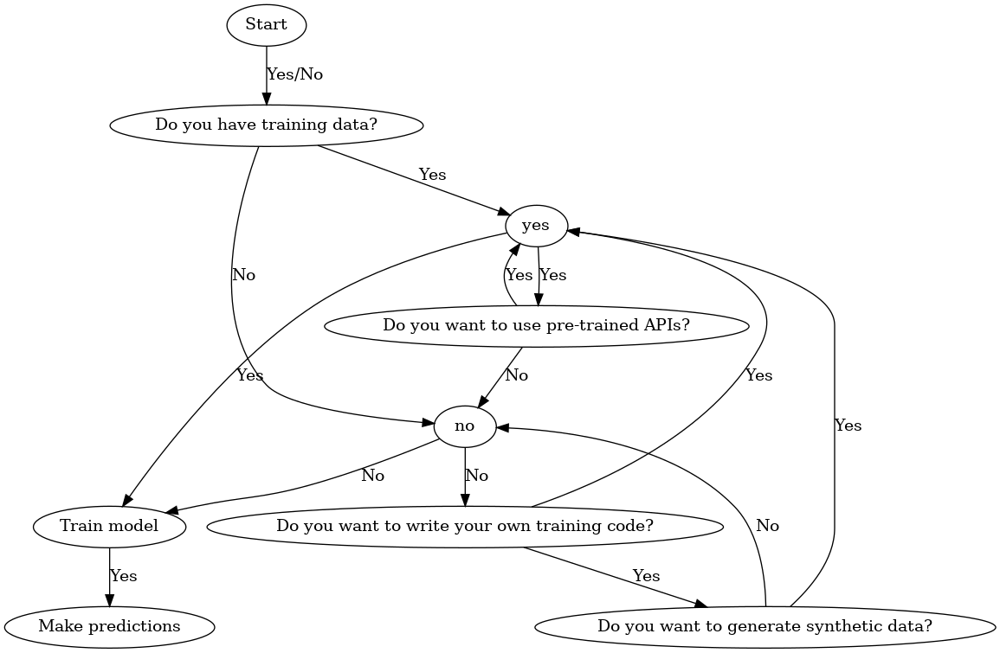

In [116]:
IPython.display.Image('flowchart.png.png')

### Text Prompt - With Function Calling

Add a description of a function while calling Gemini and get responses that conform to the inputs of that function. [Reference: Function Calling](https://cloud.google.com/vertex-ai/docs/generative-ai/multimodal/function-calling).
- [Excellent Introduction](https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/function-calling/intro_function_calling.ipynb)


What if you have a function the looks up the start time for baseball games and it looked like:

```Python
def game_time(date, team):
...
```

When using an LLM to generate responses it could be very helpful if a users question was turned into a proper function call to lookup the information they were requesting.  Like "What time is the cubs game today?".

In [181]:
game_time_func = vertexai.generative_models.FunctionDeclaration(
    name = 'game_time',
    description = 'Retrieve the start time for a baseball teams game on a given date.',
    parameters = {
        'type': 'object',
        'properties': {
            'date': {'type': 'string', 'description': 'Date in dd/mm/yyyy format', 'example': '04/04/2024'},
            'team': {'type': 'string', 'description': 'MLB Team Name'},
            'visiting_team': {'type': 'boolean', 'description': 'Option to return the visiting teams names.'}
        },
        'required': ['date', 'team']
    }
)

In [183]:
response = gemini_text.generate_content(
    'When do the Cubs play on April 4th?'
)
print(response.text)

The Chicago Cubs do not play on April 4th, 2023. Their next game is on April 6th against the Pittsburgh Pirates.


In [184]:
response = gemini_text.generate_content(
    'When do the Mets play on April 10th this year?',
    tools = [
        vertexai.generative_models.Tool(
            function_declarations = [game_time_func]
        )
    ]
)
response

candidates {
  content {
    role: "model"
    parts {
      function_call {
        name: "game_time"
        args {
          fields {
            key: "date"
            value {
              string_value: "04/10/2023"
            }
          }
          fields {
            key: "team"
            value {
              string_value: "Mets"
            }
          }
        }
      }
    }
  }
  finish_reason: STOP
  safety_ratings {
    category: HARM_CATEGORY_HATE_SPEECH
    probability: NEGLIGIBLE
    probability_score: 0.10052486509084702
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.07329727709293365
  }
  safety_ratings {
    category: HARM_CATEGORY_DANGEROUS_CONTENT
    probability: NEGLIGIBLE
    probability_score: 0.12624557316303253
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.18447348475456238
  }
  safety_ratings {
    category: HARM_CATEGORY_HARASSMENT
    probability: NEGLIGIBLE
    probability_score: 0.08359067142009735
    severity: HAR

In [185]:
response = gemini_text.generate_content(
    'When do the Mets play on April 10th this year? who is the visiting team?',
    tools = [
        vertexai.generative_models.Tool(
            function_declarations = [game_time_func]
        )
    ]
)
response

candidates {
  content {
    role: "model"
    parts {
      function_call {
        name: "game_time"
        args {
          fields {
            key: "date"
            value {
              string_value: "04/10/2023"
            }
          }
          fields {
            key: "team"
            value {
              string_value: "Mets"
            }
          }
        }
      }
    }
  }
  finish_reason: STOP
  safety_ratings {
    category: HARM_CATEGORY_HATE_SPEECH
    probability: NEGLIGIBLE
    probability_score: 0.10762491822242737
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.06512755155563354
  }
  safety_ratings {
    category: HARM_CATEGORY_DANGEROUS_CONTENT
    probability: NEGLIGIBLE
    probability_score: 0.1474323868751526
    severity: HARM_SEVERITY_NEGLIGIBLE
    severity_score: 0.17412921786308289
  }
  safety_ratings {
    category: HARM_CATEGORY_HARASSMENT
    probability: NEGLIGIBLE
    probability_score: 0.09859886765480042
    severity: HARM

In [186]:
function_call = response.candidates[0].content.parts[0].function_call
function_call

name: "game_time"
args {
  fields {
    key: "date"
    value {
      string_value: "04/10/2023"
    }
  }
  fields {
    key: "team"
    value {
      string_value: "Mets"
    }
  }
}

In [187]:
function_call.args

In [188]:
dict(function_call.args)

{'date': '04/10/2023', 'team': 'Mets'}

In [189]:
string_call = function_call.name + '('
args = function_call.args
for x in args:
    string_call += f'{x} = "{args[x]}",'
string_call = string_call[0:-1] + ')'

print(string_call)

game_time(date = "04/10/2023",team = "Mets")


### Token Count

In [190]:
gemini_text.count_tokens(prompt)

total_tokens: 8
total_billable_characters: 30

In [191]:
gemini_multimodal.count_tokens([prompt_image, prompt])

total_tokens: 266
total_billable_characters: 30

In [192]:
gemini15_multimodal.count_tokens(prompt)

total_tokens: 8
total_billable_characters: 30

### Alternate API/SDK - `aiplatform`

An alternate to prediction request with the `vertexai` SDK is the full `aiplatform` SDK using the [PredictionServiceClient](https://cloud.google.com/python/docs/reference/aiplatform/latest/google.cloud.aiplatform_v1.services.prediction_service.PredictionServiceClient).  Example follows:

In [150]:
MODEL_ID = 'gemini-1.5-pro-preview-0409'

In [151]:
aiplatform.init(project = PROJECT_ID, location = REGION)

In [152]:
client_options = {"api_endpoint": f"{REGION}-aiplatform.googleapis.com"}
predictor = aiplatform.gapic.PredictionServiceClient(client_options = client_options)

**EXAMPLE COMING SOON**

### Switching Regions or using Multiple Regions

The `vertexai` Python API makes it easy to switch regions or use multiple region with the [`vertexai.init()`](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai#vertexai_init) method.

**References**:
- [Available Locations](https://cloud.google.com/vertex-ai/generative-ai/docs/learn/locations)
    - Verify which models are avialable in different regions
- [Quotas and Limits](https://cloud.google.com/vertex-ai/generative-ai/docs/quotas#quotas_by_region_and_model)
    - Verify default quota for models by region.  Note: default quota for models can differ by region.

### Switching Regions

Use `us-east1`

In [202]:
vertexai.init(location = 'us-east1')
gemini_example = vertexai.generative_models.GenerativeModel("gemini-1.0-pro")
gemini_example.generate_content("What is a good word for fast? Just one word please.").text

'Swift'

Switch to `us-central1`

In [203]:
vertexai.init(location = 'us-central1')
gemini_example = vertexai.generative_models.GenerativeModel("gemini-1.0-pro")
gemini_example.generate_content("What is a good word for fast? Just one word please.").text

'Rapid'

### Use Multiple Regions

In [204]:
import vertexai as vertexai_east1
import vertexai as vertexai_central1
import vertexai as vertexai_west1

vertexai_east1.init(location = 'us-east1')
vertexai_central1.init(location = 'us-central1')
vertexai_west1.init(location = 'us-west1')

gemini_east1 = vertexai_east1.generative_models.GenerativeModel("gemini-1.0-pro")
gemini_central1 = vertexai_central1.generative_models.GenerativeModel("gemini-1.0-pro")
gemini_west1 = vertexai_west1.generative_models.GenerativeModel("gemini-1.0-pro")

In [205]:
gemini_east1.generate_content("What is a good word for fast? Just one word please.").text

'Swift'

In [207]:
gemini_central1.generate_content("What is a good word for fast? Just one word please.").text

'Rapid'

In [209]:
gemini_west1.generate_content("What is a good word for fast? Just one word please.").text

'Swift'

---
## Language Models

Interacting with language models with the `vertexai` client is done through methods based on the type of model and interaction:
- [vertexai.language_models.TextGenerationModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextGenerationModel)
- [vertexai.language_models.TextEmbedding()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextEmbedding)
- [vertexai.language_models.ChatModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.ChatModel)
- [vertexai.language_models.CodeChatModel](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.CodeChatModel)
- [vertexai.language_models.CodeGenerationModel](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.CodeGenerationModel)

These methods are followed with methods to retrieve either:
- hosted models on Vertex AI with `.from_pretrained(model_name = str)`
- or, in cases where tuning is possible and has been conducted, `.get_tuned_model(tuned_model_name = str)`

### Text Generation

This is the main thing we think about with generative AI. Ask a quesiton in a prompt and get a response.  

- [vertexai.language_models.TextGenerationModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextGenerationModel)

In [12]:
prompt = "What is the first paragraph of the book A Tale of Two Cities?"

In [13]:
response = text_model.predict(prompt)
response

 It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way—in short, the period was so far like the present period, that some of its noisiest authorities insisted on its being received, for

#### Parameters

The prediction request can include parameters:
- max_output_tokens = upper limit for amount of text in the response
- temperature = [0, 1] value that control the randomness of token selection where 0 always selects the most likely next token and 1 is the highest level or randomness is selection from available tokens controlled by `top_k` and `top_p`
- top_k = an integer that limits the number of token considered in the selection of the next token
- top_p = a value in [0,1] that sets sum of probabilities from which the list of candidate tokens is selected from where the token probabilities are ordered from largest to smallest
- stop_sequences = a list of up to five character strings that will stop response generation
- candidate_count = number of candidate responses to consider

In [14]:
response = text_model.predict(
    prompt, 
    max_output_tokens = 200, 
    temperature = .4, 
    top_k = 10, 
    top_p = .5, 
    stop_sequences = ['noisiest authorities'], 
    candidate_count = 1)
response

 "It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way—in short, the period was so far like the present period, that some of its 

Notice that the response is shorter.  In this case not because the limit of `max_output_tokens` but because the `stop_sequence` ended the response when it encountered the phrase 'noisiest authorities'.  Also, the impact of `temperature`, `top_k` and `top_p` where minimized because the response is a know value from a popular literary work.

The response actually include information for understancing it type and potential source.  In this case the response is, as requested, a direct qoute from a popular work.  Additional parameters are found in the response which is an object of type [TextGenerationResponse()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextGenerationResponse).

#### Grounding

Automatically ground prompts in the API call by providing a link to a retrieval source.  In this case Vertex AI Search & Conversation data stores can be directly reference for context retrieval.

This section uses a data store created in this repository: [Vertex AI Search](./Vertex%20AI%20Search/readme.md)
- A data store and search application are created using the official rules manual of baseball

[Reference: Grounding in Vertex AI](https://cloud.google.com/vertex-ai/docs/generative-ai/grounding/ground-language-models)

In [24]:
prompt_baseball = 'In baseball, is it a homerun if the ball is deflected off a glove over the fence?'

In [25]:
response = text_model.predict(
    prompt_baseball
)
response

 No, it is not a home run if the ball is deflected off a glove over the fence. In baseball, a home run is awarded when a batter hits the ball over the outfield fence without it touching the ground. If the ball is deflected off a fielder's glove and then goes over the fence, it is ruled a double.

This answer comes directly from the LLM, which means it must have had access to baseball information during pre-training.   

Next, the same call to the same llm is done while including a grounding source that includes just the official rules of baseball.  The API will automatically search, retrieve and include context in the prompt for a ground response.

In [26]:
# VERTEX SEARCH PARAMETERS
VS_LOCATION = 'global'
VS_DATASTORE_ID = 'sports_1699306284060'

response = text_model.predict(
    prompt_baseball,
    max_output_tokens = 500,
    grounding_source = vertexai.language_models.GroundingSource.VertexAISearch(
        data_store_id = VS_DATASTORE_ID,
        location = VS_LOCATION,
        project = PROJECT_ID
    )
)
response

 Yes, it is a homerun if the ball is deflected off a glove over the fence. This is stated in the MLB rule 5.06(b)(4)(A), which states that a runner may advance to home base, scoring a run, if a fair ball goes out of the playing field in flight and he touched all bases legally; or if a fair ball which, in the umpire’s judgment, would have gone out of the playing field in flight, is deflected by the act of a fielder in throwing his glove, cap, or any article of his apparel.

This is a better answer that is correct and reference actual sections of the rules in the response to give reasoning.

#### TextGenerationResponse

In [158]:
type(response)

vertexai.language_models.MultiCandidateTextGenerationResponse

In [159]:
response._prediction_response.predictions[0]

{'content': ' "It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way—in short, the period was so far like the present period, that some of its ',
 'citationMetadata': {'citations': [{'startIndex': 2.0,
    'url': 'https://nn.wikipedia.org/wiki/Viktoriansk_litteratur',
    'endIndex': 492.0}]},
 'safetyAttributes': {'blocked': False,
  'safetyRatings': [{'probabilityScore': 0.1,
    'severityScore': 0.0,
    'severity': 'NEGLIGIBLE',
    'category': 'Dangerous Content'},
   {'probabilityScore': 0.3,
    'severityScore': 0.1,
    'severity': 'NEGLIGIBLE',
    'category': 'Harassment'},
   {'probabilityScore': 0.1,
    'severityScor

#### Async Prediction

The client has built in method for awaitable responses that make it easy to make asynchronous request.

> For detailed coverage and examples of asynchronous call to these API's, scaling, error handling, and managing fail over regions check out this notebook in the same folder: [Python Asynchronous API Calls](./Python%20Asynchronous%20API%20Calls.ipynb)

In [160]:
response = await text_model.predict_async(prompt)
response

 It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way—in short, the period was so far like the present period, that some of its noisiest authorities insisted on its being received, for

#### Streaming Prediction

The client has a built in method for streaming responses that return a generator that can be iterated:

In [161]:
for r in text_model.predict_streaming(prompt):
    print(r)

 It was the best of times, it was the worst of times, it was the age of wisdom,
 it was the age of foolishness, it was the epoch of belief, it was the epoch of incred
ulity, it was the season of Light, it was the season of Darkness, it was the spring of hope,
 it was the winter of despair, we had everything before us, we had nothing before us, we
 were all going direct to Heaven, we were all going direct the other way—in short,
 the period was so far like the present period, that some of its noisiest
 authorities insisted on its being received, for


#### Batch Prediction

For workflows that need to batch predict response for sets of prompts on a schedule or periodically, the [.batch_predict()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextGenerationModel#vertexai_language_models_TextGenerationModel_batch_predict) method can be used to submit sets for prediction as a job.

The source/destination can either be a GCS bucket or a BigQuery table.  

Here we store JSONL in GCS and use it as the source/destination location.

Start with a list of prompts:

In [162]:
prompts = [
    'What is the first paragraph of the book A Tale of Two Cities?',
    'What is the first sentence of the book A Tale of Two Cities?'
]

Convert the prompts to newline delimited JSONL:

In [163]:
batch = '\n'.join(map(json.dumps, [dict(prompt = prompt) for prompt in prompts]))

In [164]:
print(batch)

{"prompt": "What is the first paragraph of the book A Tale of Two Cities?"}
{"prompt": "What is the first sentence of the book A Tale of Two Cities?"}


Store the JSONL in GCS as the source location:

In [165]:
blob = bucket.blob(f'{SERIES}/{EXPERIMENT}/textgen/batch_input.jsonl')
blob.upload_from_string(batch)

Request the batch prediction job:

In [166]:
batch_job = text_model.batch_predict(
    dataset = f'gs://{BUCKET}/{blob.name}',
    destination_uri_prefix = f'gs://{BUCKET}/{SERIES}/{EXPERIMENT}/textgen/results'
)

Creating BatchPredictionJob
BatchPredictionJob created. Resource name: projects/1026793852137/locations/us-central1/batchPredictionJobs/4839337083459862528
To use this BatchPredictionJob in another session:
bpj = aiplatform.BatchPredictionJob('projects/1026793852137/locations/us-central1/batchPredictionJobs/4839337083459862528')
View Batch Prediction Job:
https://console.cloud.google.com/ai/platform/locations/us-central1/batch-predictions/4839337083459862528?project=1026793852137
BatchPredictionJob projects/1026793852137/locations/us-central1/batchPredictionJobs/4839337083459862528 current state:
JobState.JOB_STATE_QUEUED
BatchPredictionJob projects/1026793852137/locations/us-central1/batchPredictionJobs/4839337083459862528 current state:
JobState.JOB_STATE_QUEUED
BatchPredictionJob projects/1026793852137/locations/us-central1/batchPredictionJobs/4839337083459862528 current state:
JobState.JOB_STATE_SUCCEEDED
BatchPredictionJob run completed. Resource name: projects/1026793852137/locat

In [167]:
batch_job.output_info.gcs_output_directory

'gs://statmike-mlops-349915/applied-genai/getting-started/textgen/results/prediction-model-2024-02-24T00:34:59.825997Z'

In [168]:
outputs = list(gcs.list_blobs(bucket, prefix = batch_job.output_info.gcs_output_directory.split(f'gs://{BUCKET}/')[-1]))

In [169]:
outputs

[<Blob: statmike-mlops-349915, applied-genai/getting-started/textgen/results/prediction-model-2024-02-24T00:34:59.825997Z/000000000000.jsonl, 1708734923298653>]

In [170]:
for blob in outputs:
    with blob.open('r') as f:
        lines = f.readlines()
        lines = [json.loads(line) for line in lines]

In [171]:
for line in lines:
    print(line['predictions'][0]['content'], '\n\n')

 It was the best of times, it was the worst of times, 


 "It was the best of times, it was the worst of times, it was the age of wisdom, it was the age of foolishness, it was the epoch of belief, it was the epoch of incredulity, it was the season of Light, it was the season of Darkness, it was the spring of hope, it was the winter of despair, we had everything before us, we had nothing before us, we were all going direct to Heaven, we were all going direct the other way 




### Chat

Chat is an extension of text generation where there is a session in which the back and forth create a cumulative context from which future questions frame answers around.

- [vertexai.language_models.ChatModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.ChatModel)

In [172]:
chat = chat_model.start_chat(
    context = 'You are an umpire for Major League Baseball in the United States.',
    examples = [
        vertexai.language_models.InputOutputTextPair(
            input_text = 'How many players are allowed in the outfield?',
            output_text = 'There are only three players allowed in the outfield: left fielder, center fielder, and right fielder.'
        )
    ]
)

In [173]:
response = chat.send_message('How many bases are there?')
response

 There are four bases in baseball: home plate, first base, second base, and third base. Home plate is where the batter stands to hit the ball, and it is also where the runner scores a run. First base is the first base that the runner must reach after hitting the ball. Second base is the second base that the runner must reach after reaching first base. Third base is the third base that the runner must reach after reaching second base.

In [174]:
response = chat.send_message('Four? What are they called?')
response

 The four bases in baseball are called home plate, first base, second base, and third base. Home plate is where the batter stands to hit the ball, and it is also where the runner scores a run. First base is the first base that the runner must reach after hitting the ball. Second base is the second base that the runner must reach after reaching first base. Third base is the third base that the runner must reach after reaching second base.

In [175]:
response = chat.send_message('So home plate is a base?')
response

 Yes, home plate is considered a base in baseball. It is the fourth and final base that a runner must touch in order to score a run. Home plate is located at the intersection of the foul lines and the batter's box.

#### Chat Session

As the chat progresses it is collected in a chat session:

In [176]:
type(chat)

vertexai.language_models.ChatSession

To review the chat transcript view the `message_history` property:

In [177]:
chat.message_history

[ChatMessage(content='How many bases are there?', author='user'),
 ChatMessage(content=' There are four bases in baseball: home plate, first base, second base, and third base. Home plate is where the batter stands to hit the ball, and it is also where the runner scores a run. First base is the first base that the runner must reach after hitting the ball. Second base is the second base that the runner must reach after reaching first base. Third base is the third base that the runner must reach after reaching second base.', author='bot'),
 ChatMessage(content='Four? What are they called?', author='user'),
 ChatMessage(content=' The four bases in baseball are called home plate, first base, second base, and third base. Home plate is where the batter stands to hit the ball, and it is also where the runner scores a run. First base is the first base that the runner must reach after hitting the ball. Second base is the second base that the runner must reach after reaching first base. Third bas

### Text Embedding

An LLM that efficiently represent text as a vector of numbers.  This is great for finding similar text (search), place unkown text near matches in know grouping (classification), group text together (clustering), identifying mismatching text (anomalies and outliers), finding patterns in conversation (topic labeling), and much more.

- [vertexai.language_models.TextEmbeddingModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextEmbeddingModel)

In [178]:
prompt = "This is a string of text representing something!"

Notice that the prompt is provided in a list because multiple prompts can be sent in a single request.  If the list identifier brackets, `[]`, are missing then an error will be returned due to it treat each character of a string as a separate prompt string.

In [179]:
response = textembed_model.get_embeddings([prompt])

The response is also a list of same length as the the input prompts list. Here the first 5 values of the embedding is presented for review: 

In [180]:
len(response[0].values)

768

In [181]:
response[0].values[0:5]

[0.00298090698197484,
 -0.04526714235544205,
 0.011883601546287537,
 0.0022373925894498825,
 0.08547478169202805]

#### Async Embeddings

The client has built in method for awaitable responses that make it easy to make asynchronous request.

> For detailed coverage and examples of asynchronous call to these API's, scaling, error handling, and managing fail over regions check out this notebook in the same folder: [Python Asynchronous API Calls](./Python%20Asynchronous%20API%20Calls.ipynb)

In [182]:
response = await textembed_model.get_embeddings_async([prompt])

In [183]:
response[0].values[0:5]

[0.00298090698197484,
 -0.04526714235544205,
 0.011883601546287537,
 0.0022373925894498825,
 0.08547478169202805]

### Code Generation

Generate code based on text prompts.

- [vertexai.language_models.CodeGenerationModel](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.CodeGenerationModel)

In [184]:
prompt = 'Write a Python Function that calculates the probability of two people with the same birthday being in the same room given the number of people in the room as input.  Include code to run the function for up to 20 people.'

In [185]:
response = codegen_model.predict(prompt)
response

```python
import math

def birthday_probability(n):
  """Calculates the probability of two people with the same birthday being in the same room given the number of people in the room.

  Args:
    n: The number of people in the room.

  Returns:
    The probability of two people with the same birthday being in the room.
  """

  # Calculate the probability that no two people have the same birthday.
  probability = 1
  for i in range(1, n):
    probability *= (365 - i) / 365

  # Subtract this probability from 1 to get the probability that two people have the same birthday.
  return 1 - probability


# Run the function for up to 20 people.
for n in range(1, 21):
  print("The probability of two people with the same birthday being in a room of {} people is {:.2%}.".format(n, birthday_probability(n)))
```

Remove the first and last lines from the response:

In [186]:
code = '\n'.join(response.text.splitlines()[1:-1])
print(code)

import math

def birthday_probability(n):
  """Calculates the probability of two people with the same birthday being in the same room given the number of people in the room.

  Args:
    n: The number of people in the room.

  Returns:
    The probability of two people with the same birthday being in the room.
  """

  # Calculate the probability that no two people have the same birthday.
  probability = 1
  for i in range(1, n):
    probability *= (365 - i) / 365

  # Subtract this probability from 1 to get the probability that two people have the same birthday.
  return 1 - probability


# Run the function for up to 20 people.
for n in range(1, 21):
  print("The probability of two people with the same birthday being in a room of {} people is {:.2%}.".format(n, birthday_probability(n)))


Try the code out!  Remove the first and last lines from the string and run the code with Python built in function `exec()`:

In [187]:
exec(code)

The probability of two people with the same birthday being in a room of 1 people is 0.00%.
The probability of two people with the same birthday being in a room of 2 people is 0.27%.
The probability of two people with the same birthday being in a room of 3 people is 0.82%.
The probability of two people with the same birthday being in a room of 4 people is 1.64%.
The probability of two people with the same birthday being in a room of 5 people is 2.71%.
The probability of two people with the same birthday being in a room of 6 people is 4.05%.
The probability of two people with the same birthday being in a room of 7 people is 5.62%.
The probability of two people with the same birthday being in a room of 8 people is 7.43%.
The probability of two people with the same birthday being in a room of 9 people is 9.46%.
The probability of two people with the same birthday being in a room of 10 people is 11.69%.
The probability of two people with the same birthday being in a room of 11 people is 14.

#### Async Prediction

The client has built in method for awaitable responses that make it easy to make asynchronous request.

> For detailed coverage and examples of asynchronous call to these API's, scaling, error handling, and managing fail over regions check out this notebook in the same folder: [Python Asynchronous API Calls](./Python%20Asynchronous%20API%20Calls.ipynb)

In [188]:
response = await codegen_model.predict_async(prompt)
response

```python
import math

def birthday_probability(n):
  """Calculates the probability of two people with the same birthday being in the same room given the number of people in the room.

  Args:
    n: The number of people in the room.

  Returns:
    The probability of two people with the same birthday being in the same room.
  """

  # Calculate the probability that no two people have the same birthday.
  probability = 1
  for i in range(1, n):
    probability *= (365 - i) / 365

  # Subtract this probability from 1 to get the probability that at least two people have the same birthday.
  return 1 - probability


# Print the probability for up to 20 people.
for n in range(1, 21):
  print("The probability of two people with the same birthday being in a room of {} people is {:.2%}.".format(n, birthday_probability(n)))
```

#### Streaming Prediction

The client has a built in method for streaming responses that return a generator that can be iterated:

In [189]:
for r in codegen_model.predict_streaming(prompt):
    print(r)

```python
import math

def birthday_probability(n):
  """Calculates the probability of two people
 with the same birthday being in the same room given the number of people in the room.

  
Args:
    n: The number of people in the room.

  Returns:
    
The probability of two people with the same birthday being in the room.
  """

  #
 Calculate the probability that no two people have the same birthday.
  probability
 = 1
  for i in range(1, n):
    probability *= (
365 - i) / 365

  # Return the complement of the probability
 that no two people have the same birthday.
  return 1 - probability

#
 Print the probability for up to 20 people.
for n in range(
1, 21):
  print(f"The probability of two people with the same
 birthday being in a room of {n} people is {birthday_probability(n
):.4f}.")
```


### Code Generation - Completion

There are smaller models that are good for completing code.  This example show taking a portion of the code generate above as input and evaluates the models ability to complete the code:

- [vertexai.language_models.CodeGenerationModel](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.CodeGenerationModel)

In [190]:
prompt = '''#
# Python function to compare two string and return a list of all indexes where the strings are different:
def string_diffs(string1, string2):
'''

In [191]:
response = codecomp_model.predict(prompt)
response

    diffs = []
    for i in range(len(string1)):
        if string1[i] != string2[i]:
            diffs.append(i)
    return diffs

In [192]:
code = prompt + response.text + "\nprint(string_diffs('abcdefghi', 'abcdfeghi'))"
print(code)

#
# Python function to compare two string and return a list of all indexes where the strings are different:
def string_diffs(string1, string2):
    diffs = []
    for i in range(len(string1)):
        if string1[i] != string2[i]:
            diffs.append(i)
    return diffs
print(string_diffs('abcdefghi', 'abcdfeghi'))


In [193]:
exec(code)

[4, 5]


### Code Chat

Chatting with code is great for documenting, adding comments, creating release notes, creating unit test, explaining, fixing, optimizing and even translating.

This example creates a chat session with the code generate from the prior section.

- [vertexai.language_models.CodeChatModel](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.CodeChatModel)

Start a chat session with just the context and set it to the code generate in the prior section:

In [194]:
codechat = codechat_model.start_chat(context = code)

In [195]:
codechat.send_message('What does the code do?')

 The code defines a function called string_diffs that takes two strings as input and returns a list of all the indexes where the strings differ.
The function iterates over the characters of the first string and compares them to the characters of the second string.
If the characters are different, the index of the character is added to the list of differences.
Finally, the list of differences is returned.
The code then calls the string_diffs function with the strings 'abcdefghi' and 'abcdfeghi' and prints the result, which is [3].

In [196]:
codechat.send_message('How would I change this code to handle input strings of different lengths?')

 To handle input strings of different lengths, you can use the min() function to compare the lengths of the two strings and iterate over the shorter string.
Here's an updated version of the code:

```python
def string_diffs(string1, string2):
    diffs = []
    shorter_string = min(string1, string2, key=len)
    for i in range(len(shorter_string)):
        if string1[i] != string2[i]:
            diffs.append(i)
    return diffs
```

This code will work correctly even if the input strings have different lengths.

In [197]:
codechat.send_message('Can you add commenting to this version that describes the steps?')

 ```python
def string_diffs(string1, string2):
    """
    Compares two strings and returns a list of all indexes where the strings are different.

    Args:
        string1 (str): The first string to compare.
        string2 (str): The second string to compare.

    Returns:
        list: A list of all indexes where the strings are different.
    """

    # Create an empty list to store the differences.
    diffs = []

    # Find the shorter of the two strings.
    shorter_string = min(string1, string2, key=len)

    # Iterate over the characters of the shorter string.
    for i in range(len(shorter_string)):
        # If the characters are different, add the index to the list of differences.
        if string1[i] != string2[i]:
            diffs.append(i)

    # Return the list of differences.
    return diffs
```

In [198]:
codechat.send_message('I plan to change to this new version, can you write release notes for the change?')

 **Release Notes**

**Version 2.0**

**New Features**

* Added support for input strings of different lengths.
* Added commenting to describe the steps of the algorithm.

**Bug Fixes**

* Fixed a bug where the function would return an empty list if the input strings were the same.

**Known Issues**

* The function does not handle Unicode characters correctly.

In [199]:
codechat.send_message('Can you write a unit test for this code?')

 ```python
import unittest

class TestStringDiffs(unittest.TestCase):
    def test_same_strings(self):
        self.assertEqual(string_diffs('abc', 'abc'), [])

    def test_different_strings(self):
        self.assertEqual(string_diffs('abc', 'abd'), [2])

    def test_different_lengths(self):
        self.assertEqual(string_diffs('abc', 'abcd'), [3])

if __name__ == '__main__':
    unittest.main()
```

In [200]:
codechat.send_message('One last thing, can you write a javascript version of the new code?')

 ```javascript
function stringDiffs(string1, string2) {
  const diffs = [];
  const shorterString = string1.length < string2.length ? string1 : string2;
  for (let i = 0; i < shorterString.length; i++) {
    if (string1[i] !== string2[i]) {
      diffs.push(i);
    }
  }
  return diffs;
}

console.log(stringDiffs('abcdefghi', 'abcdfeghi')); // [3]
```

### Get Token Count

The text models have input and output limits that are based on the number of tokens. It can be helpful to get the token count for a prompt (or response).  This can be done with the CountTokens function for a model.

> Note: This is still in preview and as of version 1.35.0 of the Python API (aiplatform) it is not yet implemented.  The following demonstrates using a REST call with the Python `requests` package.

- [Get Token Count](https://cloud.google.com/vertex-ai/docs/generative-ai/get-token-count)

In [201]:
MODEL_ID = 'text-bison@002'

In [202]:
len(prompt)

144

In [203]:
token = !gcloud auth application-default print-access-token
headers = {
    "content-type": "application/json",
    "Authorization": f'Bearer {token[0]}'
}

response = requests.post(
    f'https://{REGION}-aiplatform.googleapis.com/v1beta1/projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}:countTokens',
    data = json.dumps(dict(instances = [dict(prompt = prompt)])),
    headers = headers
)

In [204]:
result = json.loads(response.text)
result

{'totalTokens': 35, 'totalBillableCharacters': 121}

### Get List of Tokens

When tailoring prompts in can be helpful to understand how prompts are tokenized. A token list can be retrieved for prompts using the computeTokens function for a model.

> Note: This is still in preview and as of version 1.35.0 of the Python API (aiplatform) it is not yet implemented.  The following demonstrates using a REST call with the Python `requests` package.

- [Get List of Tokens](https://cloud.google.com/vertex-ai/docs/generative-ai/compute-token)

In [205]:
MODEL_ID = 'text-bison@002'

In [206]:
len(prompt)

144

In [207]:
token = !gcloud auth application-default print-access-token
headers = {
    "content-type": "application/json",
    "Authorization": f'Bearer {token[0]}'
}

response = requests.post(
    f'https://{REGION}-aiplatform.googleapis.com/v1beta1/projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}:computeTokens',
    data = json.dumps(dict(instances = [dict(prompt = prompt)])),
    headers = headers
)

In [208]:
result = json.loads(response.text)
result

{'tokensInfo': [{'tokens': ['Iw==',
    'Cg==',
    'Iw==',
    'IFB5dGhvbg==',
    'IGZ1bmN0aW9u',
    'IHRv',
    'IGNvbXBhcmU=',
    'IHR3bw==',
    'IHN0cmluZw==',
    'IGFuZA==',
    'IHJldHVybg==',
    'IGE=',
    'IGxpc3Q=',
    'IG9m',
    'IGFsbA==',
    'IGluZGV4ZXM=',
    'IHdoZXJl',
    'IHRoZQ==',
    'IHN0cmluZ3M=',
    'IGFyZQ==',
    'IGRpZmZlcmVudA==',
    'Og==',
    'Cg==',
    'ZGVm',
    'IHN0cmluZw==',
    'Xw==',
    'ZGlmZnM=',
    'KA==',
    'c3RyaW5n',
    'MQ==',
    'LA==',
    'IHN0cmluZw==',
    'Mg==',
    'KTo=',
    'Cg=='],
   'tokenIds': ['235345',
    '108',
    '235345',
    '21237',
    '1411',
    '577',
    '12711',
    '1378',
    '2067',
    '578',
    '2203',
    '476',
    '1889',
    '576',
    '832',
    '52639',
    '1570',
    '573',
    '18935',
    '708',
    '2167',
    '235292',
    '108',
    '1293',
    '2067',
    '235298',
    '226215',
    '235278',
    '1973',
    '235274',
    '235269',
    '2067',
    '235284',
    '1245',
  

---
## Vision Models

Interacting with vision models with the `vertexai` client is done through methods based on the type of model and interaction:
- [vertexai.vison_models.ImageCaptioningModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageCaptioningModel)
- [vertexai.vision_models.ImageQnAModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageQnAModel)
- [vertexai.vison_models.ImageTextModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageTextModel)
- [vertexai.vision_models.MultiModalEmbeddingModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.MultiModalEmbeddingModel)
- preview:
    - [vertexai.preview.vision_models.ImageGenerationModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.preview.vision_models.ImageGenerationModel)

First, load an image.  This notebook comes from the GitHub repository [statmike/vertex-ai-mlops](https://github.com/statmike/vertex-ai-mlops/tree/main) which has graphical explanation of many ML and MLOps concepts.

For example:

<p align="center" width="100%" style="align:center;width:100%">
    <figure style="align:center;width:100%">
        <img src="https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png" style="width:75%">
        <figcaption>https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png</figcaption>
    </figure>
</p>

Images need to be loaded to the class [vertexai.vision_models.Image()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.Image) as bytes.


In [209]:
url = 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/architectures/architectures/images/readme/decision_training.png'
image_bytes = requests.get(url).content

In [210]:
type(image_bytes)

bytes

In [211]:
image = vertexai.vision_models.Image(image_bytes = image_bytes)

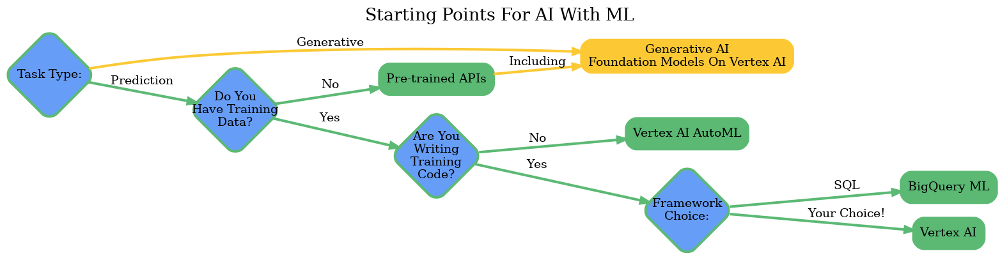

In [213]:
image.show()

### Image Captioning

Captioning, or describing, images using an image model.

- [vertexai.vison_models.ImageCaptioningModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageCaptioningModel)

In [214]:
captions = imagecap_model.get_captions(image = image, language = 'en', number_of_results = 3)

In [215]:
captions

['a diagram showing the starting points for al with ml',
 'a flow chart showing the starting points for al with ml',
 'a flow chart showing starting points for al with ml']

### Image Q&A

Answer questions with an iamge.

- [vertexai.vision_models.ImageQnAModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageQnAModel)

In [216]:
imageqna_model.ask_question(image = image, question= 'What is this?')

['starting points for al with ml']

In [218]:
imageqna_model.ask_question(image = image, question= 'How many steps are in the flowchart?')

['6']

In [219]:
imageqna_model.ask_question(image = image, question= 'How many decision points are in the flowchart?')

['4']

In [220]:
imageqna_model.ask_question(image = image, question= 'List the conditions that would lead me to use AutoML.', number_of_results = 3)

['are you writing training code? yes',
 'framework choice, your choice!',
 'are you writing training code?']

### Image Text

Notice the the two methods above, `ImageCaptioningModel()` and `ImageQnAModel()`, both use the same actual model = `imagetext@`? Well, there is a single method that can be used to do both of these task!

- [vertexai.vison_models.ImageTextModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.ImageTextModel)

In [221]:
imagetext_model.get_captions(image = image, language = 'en', number_of_results = 3)

['a diagram showing the starting points for al with ml',
 'a flow chart showing the starting points for al with ml',
 'a flow chart showing starting points for al with ml']

In [223]:
imagetext_model.ask_question(image = image, question = "What is this?", number_of_results = 3)

['starting points for al with ml',
 'starting points for ai with ml',
 'flow chart']

In [224]:
imagetext_model.ask_question(image = image, question= 'List the conditions that would lead me to use AutoML.', number_of_results = 2)

['are you writing training code? yes', 'framework choice, your choice!']

### Multi-Modal Embeddings (Image, Text, Image & Text)

Simliar to text embeddings generated with `vertexai.language_models.TextEmbeddingModel()`, you can also generate embedding of images and/or related text strings - like captions.  This is great because the image and text embedding will be from the same semantic space, hence [multimodal embeddings](https://cloud.google.com/vertex-ai/docs/generative-ai/embeddings/get-multimodal-embeddings).


- [vertexai.vision_models.MultiModalEmbeddingModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.MultiModalEmbeddingModel)

#### Text Only:

In [225]:
text_embed = multimodalembed_model.get_embeddings(contextual_text = captions[0])

In [226]:
type(text_embed)

vertexai.vision_models.MultiModalEmbeddingResponse

In [227]:
len(text_embed.text_embedding)

1408

In [228]:
text_embed.text_embedding[0:5]

[-0.0217143204, -0.00902400818, -0.0237468742, -0.00358562171, 0.01108367]

#### Image Only:

In [229]:
image_embed = multimodalembed_model.get_embeddings(image = image)

In [230]:
type(image_embed)

vertexai.vision_models.MultiModalEmbeddingResponse

In [231]:
len(image_embed.image_embedding)

1408

In [232]:
image_embed.image_embedding[0:5]

[-0.00625192, 0.0219733529, -0.0468809567, -0.0262558181, 0.0304683689]

#### Text & Image:

In [233]:
embed = multimodalembed_model.get_embeddings(contextual_text = captions[0], image = image)

In [234]:
type(embed)

vertexai.vision_models.MultiModalEmbeddingResponse

In [235]:
len(embed.text_embedding), len(embed.image_embedding)

(1408, 1408)

In [236]:
embed.text_embedding[0:5]

[-0.0217143204, -0.00902400818, -0.0237468742, -0.00358562171, 0.01108367]

In [237]:
embed.image_embedding[0:5]

[-0.00625095, 0.0219730549, -0.0468819253, -0.0262552314, 0.0304675698]

### Image Editing & Generation

An image generation model, like `imagegeneration` on Vertex AI, can generate images from text prompts (`.generate_images()`), use text prompts to edit an input image (`.edit_image()`), or even upscale an image without loosing quality (`.upscale_image()`). 

> **NOTE:** There are two Imagen models that each have different capabilities.  Imagen 2 can currently generate where Imagen can genearte, edit, and upscale. [Reference: Image genderation and editing](https://cloud.google.com/vertex-ai/docs/generative-ai/image/model-versioning#img-gen-model)

- preview:
    - [vertexai.preview.vision_models.ImageGenerationModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.preview.vision_models.ImageGenerationModel)

#### Generate

[Prompt Guide](https://cloud.google.com/vertex-ai/docs/generative-ai/image/img-gen-prompt-guide)

In [243]:
images = imagen2_model.generate_images(
    prompt = "Create a graphic for a presentation background that evokes energy, progress, and excitement.  Use the colors green, blue and yellow with a confetti background.  Make shapes shiney and small",
    negative_prompt = ['sharp edges'],
    number_of_images = 1
)

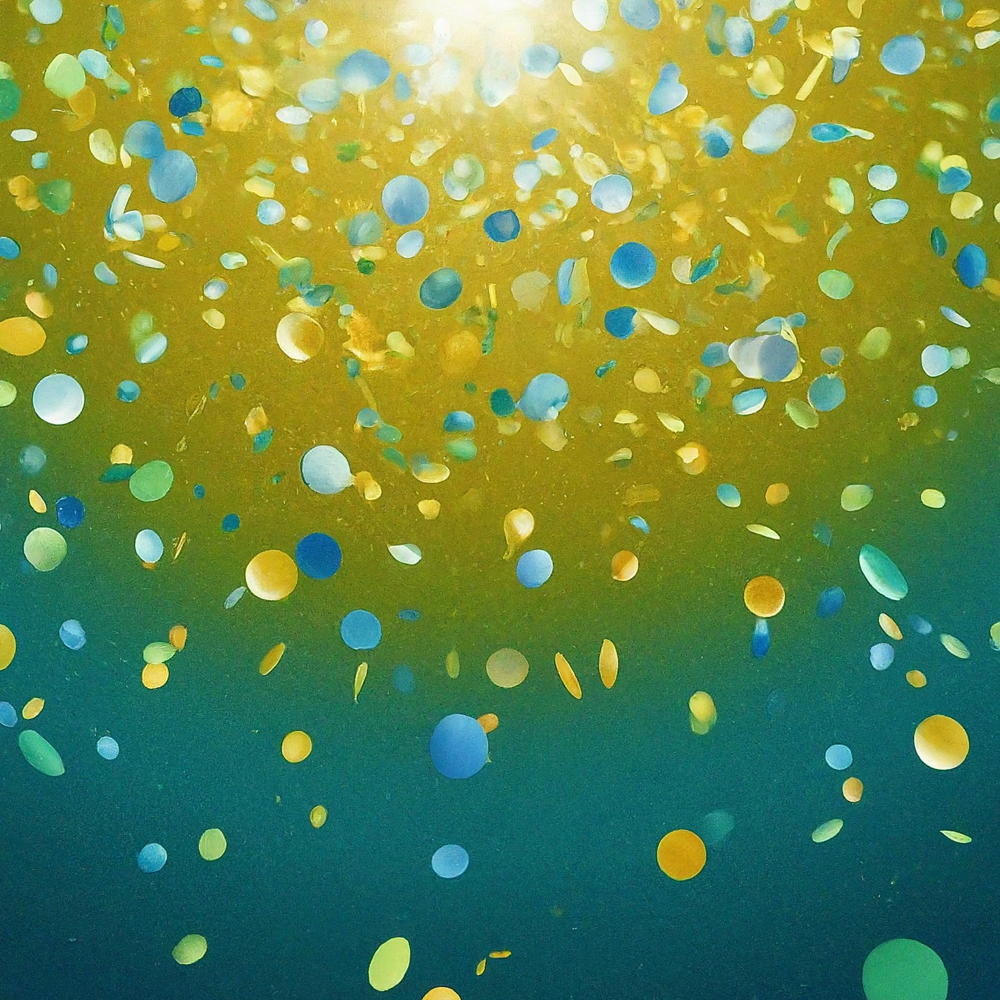

In [244]:
images[0].show()

#### Editing

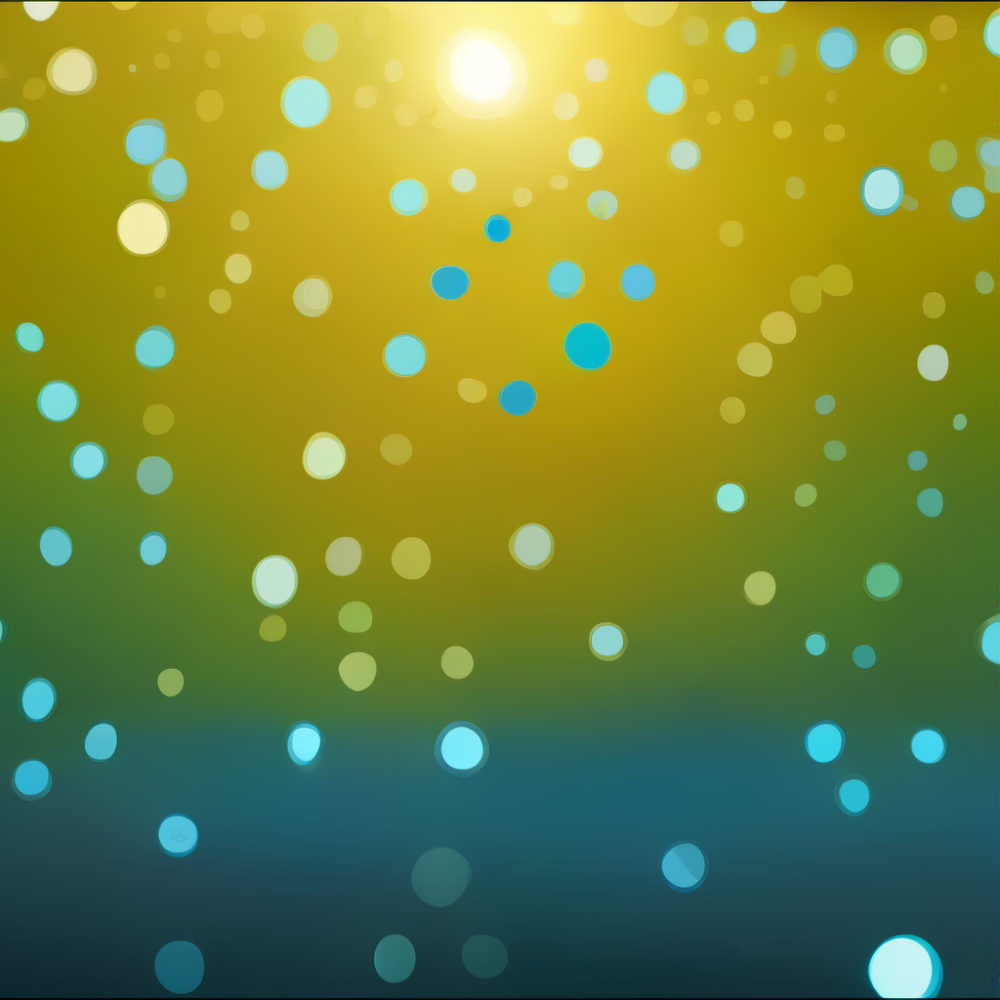

In [245]:
edited_image = imagen1_model.edit_image(
    base_image = images[0],
    prompt = 'computer',
)
edited_image[0].show()

#### Upscale

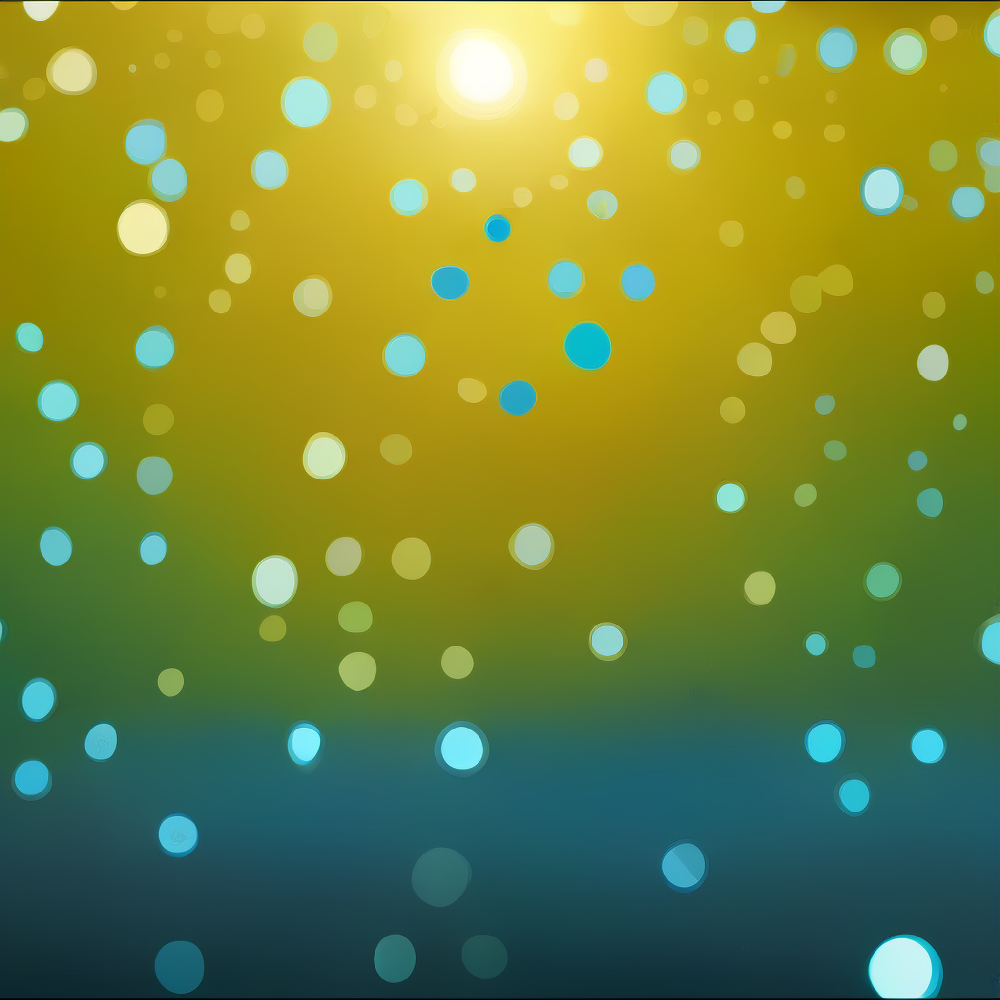

In [246]:
imagen1_model.upscale_image(
    image = edited_image[0],
    new_size = 2048
).show()

---
## Alternate API/SDK - `aiplatform`

An alternate to prediction request with the `vertexai` SDK is the full `aiplatform` SDK using the [PredictionServiceClient](https://cloud.google.com/python/docs/reference/aiplatform/latest/google.cloud.aiplatform_v1.services.prediction_service.PredictionServiceClient).  Example follows:

In [247]:
MODEL_ID = 'text-bison@002'

In [248]:
aiplatform.init(project = PROJECT_ID, location = REGION)

In [249]:
client_options = {"api_endpoint": f"{REGION}-aiplatform.googleapis.com"}
predictor = aiplatform.gapic.PredictionServiceClient(client_options = client_options)

In [250]:
prediction = predictor.predict(
    endpoint = f"projects/{PROJECT_ID}/locations/{REGION}/publishers/google/models/{MODEL_ID}",
    parameters = {
      "temperature": 0.2,
      "maxOutputTokens": 256,
      "topP": 0.8,
      "topK": 40,    
    },
    instances = [{"content": prompt}]
)

In [251]:
prediction

predictions {
  struct_value {
    fields {
      key: "safetyAttributes"
      value {
        struct_value {
          fields {
            key: "scores"
            value {
              list_value {
                values {
                  number_value: 0.2
                }
                values {
                  number_value: 0.3
                }
                values {
                  number_value: 0.3
                }
                values {
                  number_value: 0.1
                }
                values {
                  number_value: 0.1
                }
                values {
                  number_value: 0.2
                }
                values {
                  number_value: 0.1
                }
                values {
                  number_value: 0.6
                }
                values {
                  number_value: 0.1
                }
                values {
                  number_value: 0.1
                }
       

In [252]:
dict(prediction.metadata['tokenMetadata']['outputTokenCount'])

{'totalBillableCharacters': 583.0, 'totalTokens': 208.0}

In [253]:
dict(prediction.metadata['tokenMetadata']['inputTokenCount'])

{'totalTokens': 35.0, 'totalBillableCharacters': 121.0}